In [1]:
# imported necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
import warnings
warnings.filterwarnings("ignore")

In [2]:
import sqlite3
con = sqlite3.connect("final.sqlite")

In [3]:
cleaned_data = pd.read_sql_query("select * from Reviews", con)

In [4]:
cleaned_data.shape

(364171, 12)

In [5]:
# Sort data based on time
cleaned_data["Time"] = pd.to_datetime(cleaned_data["Time"], unit = "s")
cleaned_data = cleaned_data.sort_values(by = "Time")
#cleaned_data.head()

In [6]:
cleaned_data["Score"].value_counts()

positive    307061
negative     57110
Name: Score, dtype: int64

In [7]:
final = cleaned_data.iloc[:50000,:]
final.shape

(50000, 12)

# K-Means Clustering


## Bag of Word

In [454]:
# 100k data which will use to train model after vectorization
X = final["CleanedText"]
print("shape of X:", X.shape)

shape of X: (50000,)


In [455]:
# Vectorizor
bow = CountVectorizer()
feat = bow.fit_transform(X)
feat

<50000x27002 sparse matrix of type '<class 'numpy.int64'>'
	with 1484064 stored elements in Compressed Sparse Row format>

In [456]:
# Standardization
std = StandardScaler(with_mean = False)
std_feat = std.fit_transform(feat)
std_feat

<50000x27002 sparse matrix of type '<class 'numpy.float64'>'
	with 1484064 stored elements in Compressed Sparse Row format>

In [11]:
#Plot each cluster features in a cloud
def plot_cluster_cloud(features, coef):
    coef_df = pd.DataFrame(coef, columns = features)
    print(len(coef_df))
    # Create a figure and set of 15 subplots because our k range is in between 
    fig, axes = plt.subplots(5, 3, figsize = (30, 20))
    fig.suptitle("Top 20 words for each cluster ", fontsize = 50)
    cent = range(len(coef_df))
    for ax, i in zip(axes.flat, cent):
        wordcloud = WordCloud(background_color = "white").generate_from_frequencies(coef_df.iloc[i,:].sort_values(ascending = False)[0:20])
        ax.imshow(wordcloud)
        ax.set_title("Cluster {} word cloud".format(i+1), fontsize = 30)
        ax.axis("off")
    plt.tight_layout()
    fig.subplots_adjust(top = 0.90)
    plt.show()

In [253]:
# Plot each review of a given cluster based on label
def plot_word_cloud(txt):
    # store each word from review
    cloud = " ".join(word for word in txt)
    cloud
    # Remove duplicate words
    stopwords = set(STOPWORDS) 
    # call built-in method WordCloud for creating an object for drawing a word cloud 
    wordcloud = WordCloud(width = 1000, height = 600, background_color ='white', stopwords = stopwords).generate(cloud)
    # plot the WordCloud image                        
    plt.figure(figsize = (10, 8))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis("off") 
    plt.title("World cloud of reviews")
    plt.tight_layout(pad = 0)
  
    plt.show()

In [457]:
# Elbow method to find K in k_means clustering
# inertia_ is sum of squared distances of samples to their closest cluster center.
def find_optimal_k(std_data):
    loss = []
    k = list(range(2, 15))
    for noc in k:
        model = KMeans(n_clusters = noc)
        model.fit(std_data)
        loss.append(model.inertia_)
    plt.plot(k, loss, "-o")
    plt.title("Elbow method to choose k")
    plt.xlabel("K")
    plt.ylabel("Loss")
    plt.show()

Wall time: 0 ns


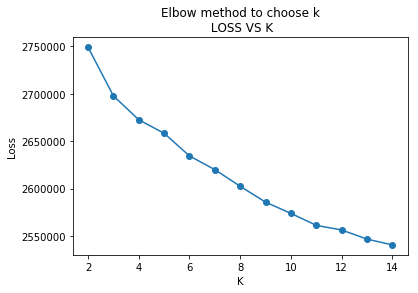

In [13]:
# Elbow method to compute K 
# This is same as the above function(find_optimal_k)do not confused with this.
%time
loss = []
k = list(range(2, 15))
for noc in k:
    model = KMeans(n_clusters = noc)
    model.fit(feat)
    loss.append(model.inertia_)
plt.plot(k, loss, "-o")
plt.title("Elbow method to choose k\n LOSS VS K")
plt.xlabel("K")
plt.ylabel("Loss")
plt.show()

In [14]:
# training kmeans
clf = KMeans(n_clusters = 9)
clf.fit(std_feat)
pred = clf.predict(std_feat)

9


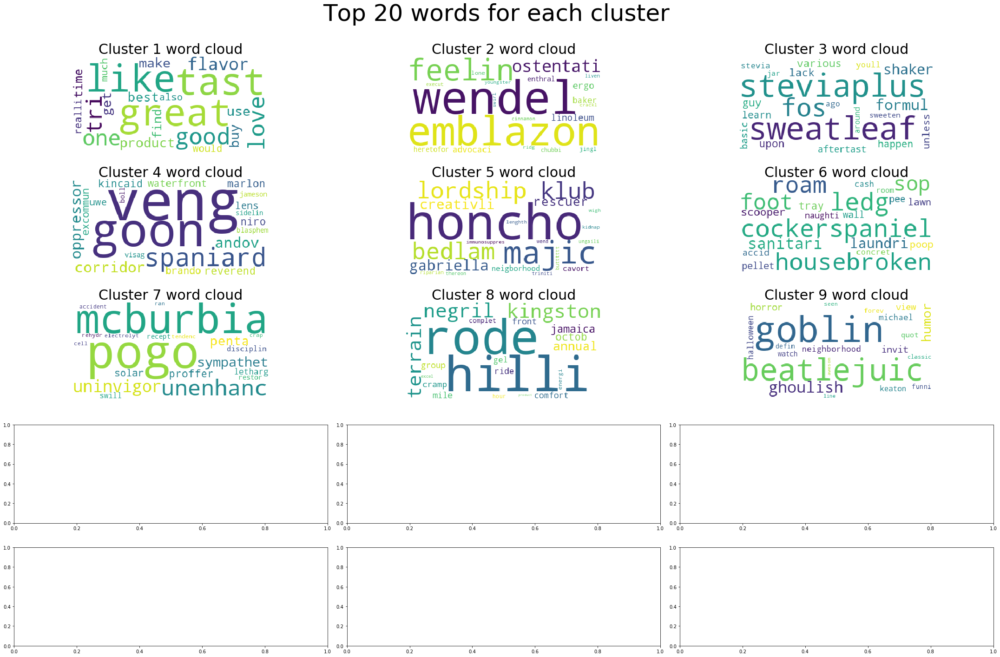

In [15]:
# getting feature names in features 
# and the cluster centers in coef
# Plot the all cluster with their corresponding features
features = bow.get_feature_names()
coef = clf.cluster_centers_
plot_cluster_cloud(features, coef)

**Observations**<br>
1. We choose k value using elbow method and found k value to be 9. 
2. Applied kmeans on bow and plot each cluster and found that each cluster atleast contains 20 words. 
3. As we can see in word cloud, some cluster have nicely group together but some have some other word which are not related at all.

## TF-IDF

In [64]:
# 5k data-points
X = final["CleanedText"]

In [65]:
# Featurization
tfidf = TfidfVectorizer()
feat = tfidf.fit_transform(X)
feat

<50000x27002 sparse matrix of type '<class 'numpy.float64'>'
	with 1484064 stored elements in Compressed Sparse Row format>

In [66]:
# Standardization
std = StandardScaler(with_mean = False)
std_data = std.fit_transform(feat)
std_data

<50000x27002 sparse matrix of type '<class 'numpy.float64'>'
	with 1484064 stored elements in Compressed Sparse Row format>

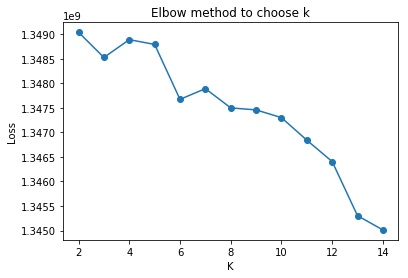

In [69]:
# Call utility function to get k
find_optimal_k(std_data)

In [70]:
# Kmeans to 
clf = KMeans(n_clusters = 6)
clf.fit(std_data)
pred = clf.predict(std_data)

In [62]:
clf.cluster_centers_.shape

(11, 27002)

6


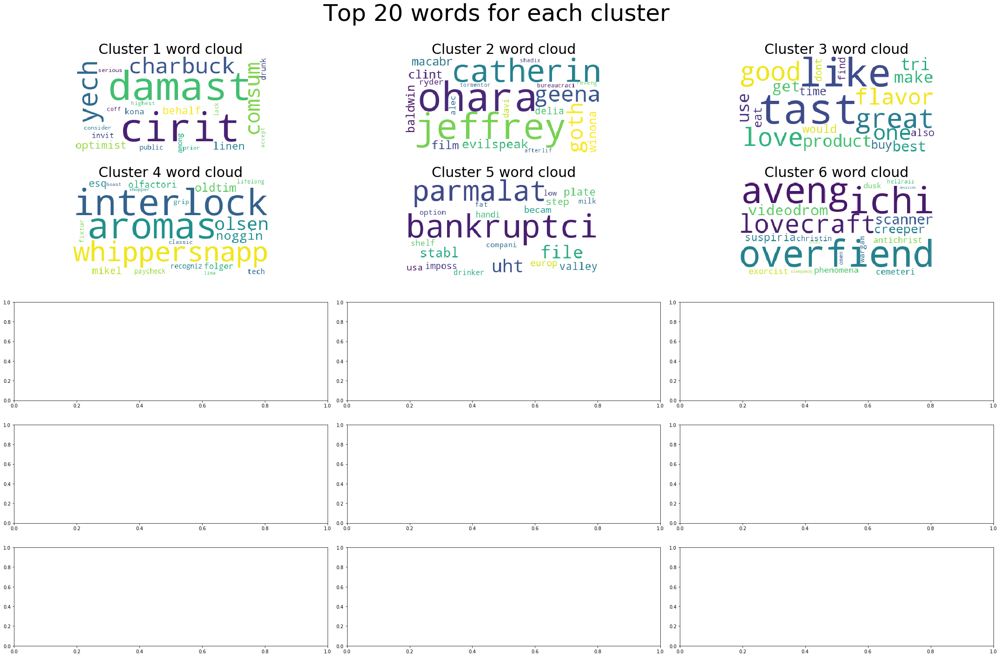

In [72]:
features = tfidf.get_feature_names()
coef = clf.cluster_centers_
plot_cluster_cloud(features, coef)

**Observations**<br>
1. we have total 6 cluster and by looking at the word cloud of each cluster we can say almost none of the cluster have similar meaning of features neither they are related somehow. All cluster have mixed features. 

## Word2Vec

In [73]:
# data
X = final["Text"]
X.shape

(50000,)

In [74]:
import re
def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned

In [75]:
# Train your own Word2Vec model using your own train text corpus
import gensim
list_of_sent=[]
for sent in X:
    filtered_sentence=[]
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_sent.append(filtered_sentence)

In [76]:
# Train word2vec model with your own corpus
w2v_model = gensim.models.Word2Vec(list_of_sent, min_count = 5, size = 50, workers = 4)

In [77]:
# Check similar word to like
w2v_model.wv.most_similar('like')

[('prefer', 0.6391164064407349),
 ('mean', 0.6134073734283447),
 ('think', 0.5840848088264465),
 ('miss', 0.5640555620193481),
 ('crave', 0.5610888004302979),
 ('awful', 0.5601608753204346),
 ('gross', 0.557422399520874),
 ('love', 0.5546953678131104),
 ('overpower', 0.5535687208175659),
 ('fine', 0.5516911149024963)]

In [78]:
# word2vec vocabulary 
w2v = w2v_model[w2v_model.wv.vocab]

In [79]:
w2v.shape

(13832, 50)

### Average Word2Vec

In [80]:
#Plot each cluster features in a cloud
def plot_cluster_cloud(features, coef):
    coef_df = pd.DataFrame(coef, columns = features)
    print(len(coef_df))
    fig, axes = plt.subplots(5, 3, figsize = (30, 20))
    fig.suptitle("Top 20 words for each cluster ", fontsize = 50)
    cent = range(len(coef_df))
    for ax, i in zip(axes.flat, cent):
        wordcloud = WordCloud(background_color = "white").generate_from_frequencies(coef_df.iloc[i,:].sort_values(ascending = False)[0:20])
        ax.imshow(wordcloud)
        ax.set_title("Cluster {} word cloud".format(i+1), fontsize = 30)
        ax.axis("off")
    plt.tight_layout()
    fig.subplots_adjust(top = 0.90)
    plt.show()

In [81]:
def plot_word_cloud(txt):
    # store each word from review
    cloud = " ".join(word for word in txt)
    cloud
    # Remove duplicate words
    stopwords = set(STOPWORDS) 
    # call built-in method WordCloud for creating an object for drawing a word cloud 
    wordcloud = WordCloud(width = 1000, height = 600, background_color ='white', stopwords = stopwords).generate(cloud)
    # plot the WordCloud image                        
    plt.figure(figsize = (10, 8))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis("off") 
    plt.title("World cloud of top words")
    plt.tight_layout(pad = 0)
  
    plt.show()

In [82]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = [] # the avg-w2v for each sentence/review is stored in this list
for sent in list_of_sent: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    cnt_words =0 # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

50000
50


In [84]:
# Convert data list to an array
X = np.array(sent_vectors)
X.shape

(50000, 50)

In [85]:
# Standardization
std = StandardScaler(with_mean = False)
std_data = std.fit_transform(X)

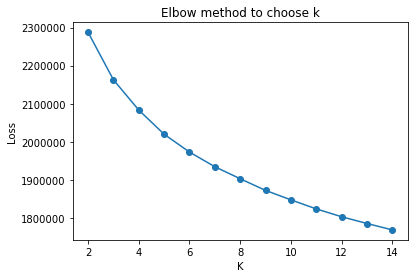

In [86]:
# Find k
find_optimal_k(std_data)

In [87]:
# KMeans Clustering
clf = KMeans(n_clusters = 10)
clf.fit(std_data)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [ ]:
# Assign each review to its cluster label
# i.e. Which review belongs to which cluster
final["cluster_label"] = clf.labels_

Total number of review in cluster 0 is: 5039


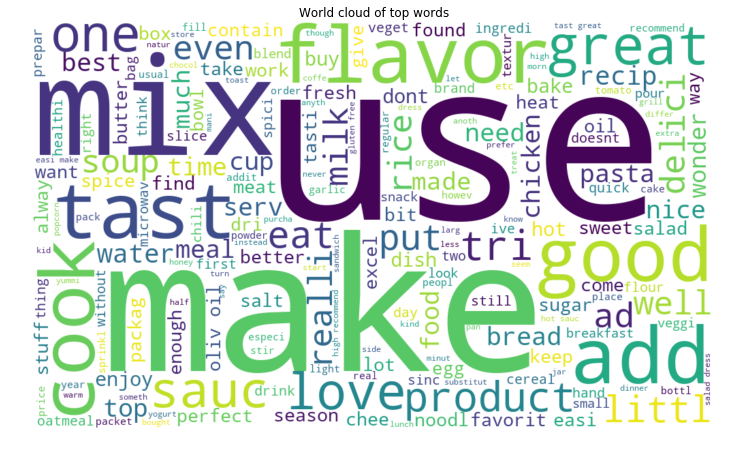

Total number of review in cluster 1 is: 7190


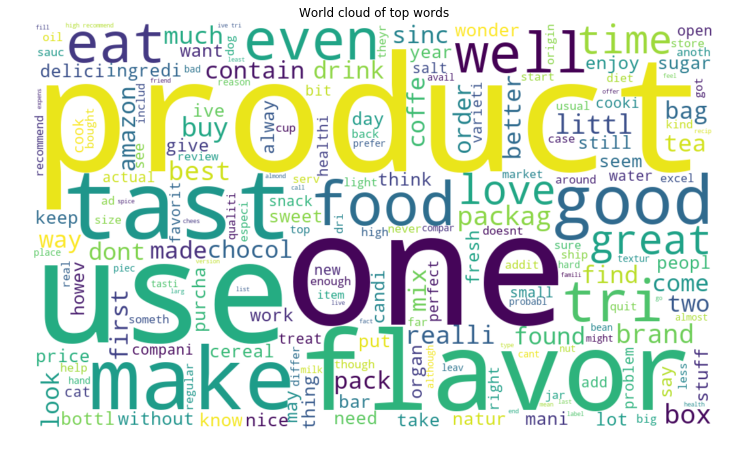

Total number of review in cluster 2 is: 2603


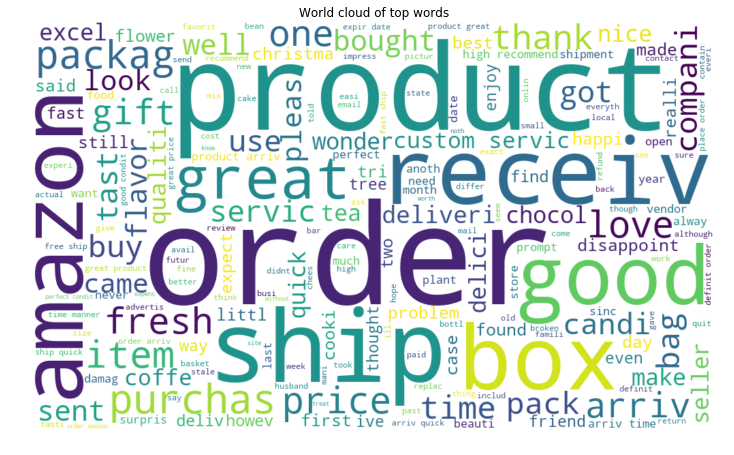

Total number of review in cluster 3 is: 7157


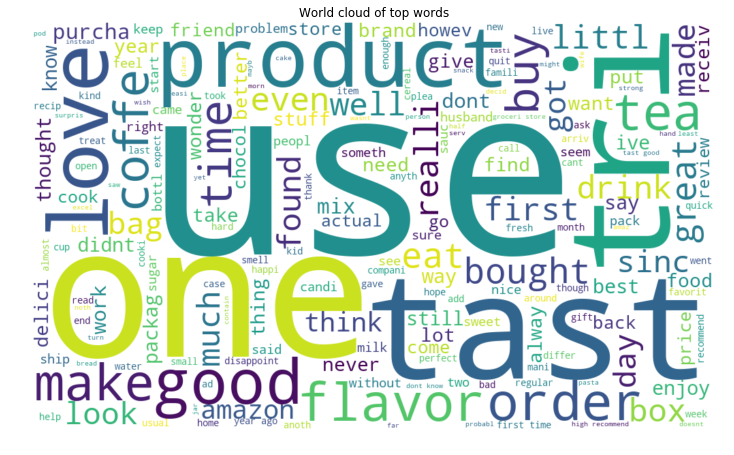

Total number of review in cluster 4 is: 5800


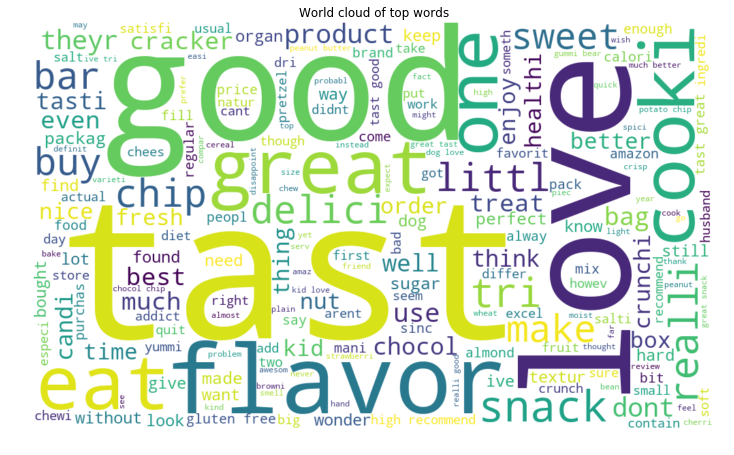

Total number of review in cluster 5 is: 3455


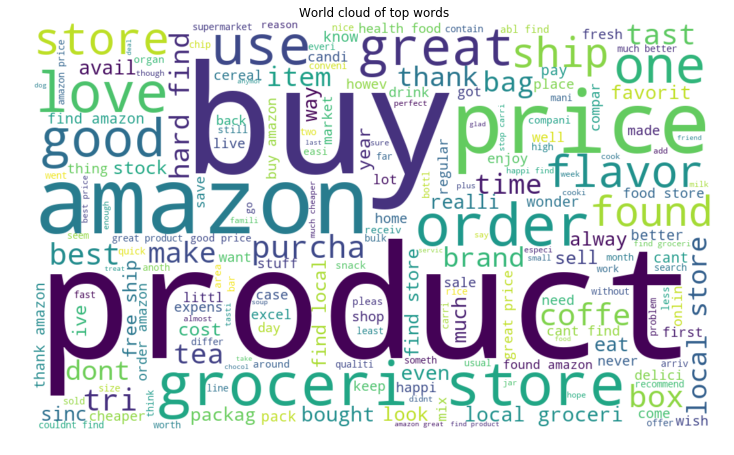

Total number of review in cluster 6 is: 4051


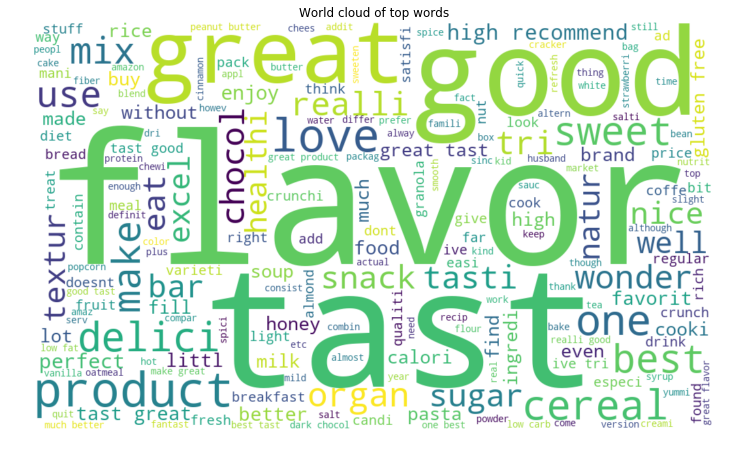

Total number of review in cluster 7 is: 4985


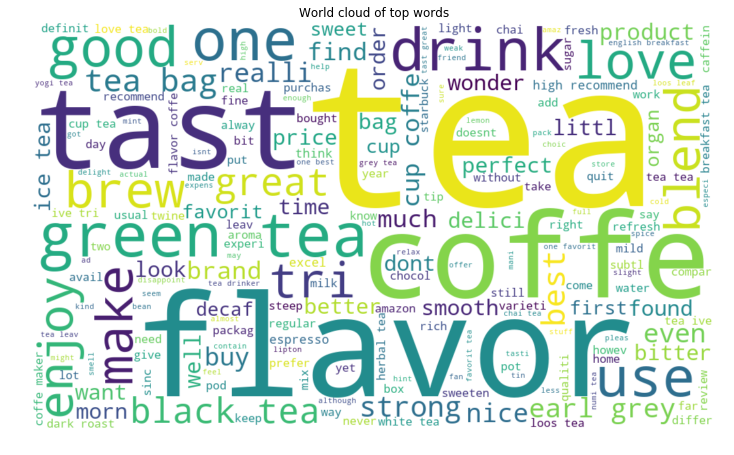

Total number of review in cluster 8 is: 5334


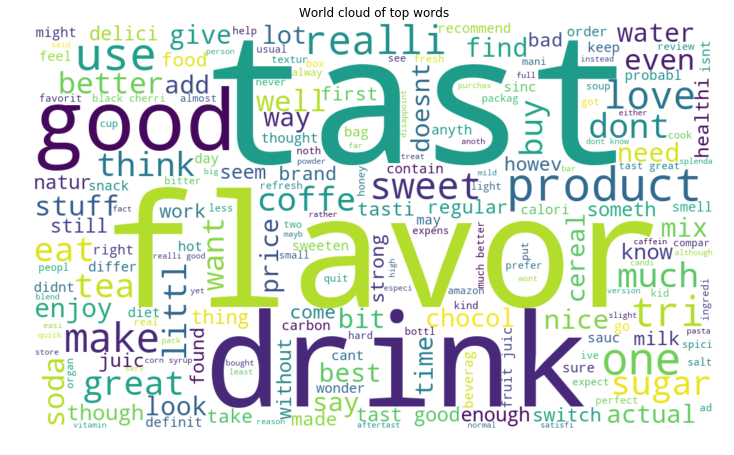

Total number of review in cluster 9 is: 4386


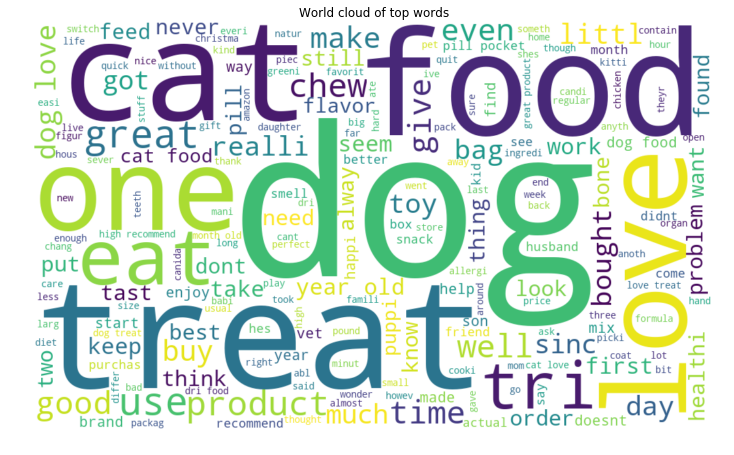

In [91]:
# For each cluster, group with its corresponding label.
for i in range(clf.n_clusters):
    l = list()
    label = final.groupby(["cluster_label"]).groups[i]
    # For each label get the total review and put into a list(l)
    for j in range(len(label)):
        l.append(final.loc[label[j]]["CleanedText"].decode())
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    # Call plot_word_cloud method to plot review in each cluster 
    plot_word_cloud(l)

**Observations**<br>
1. We applied kmeans on word2vec and choose optimal number of cluster using elbow method. 
2. We can not get features directly from word2vec so we get lebel after training of kmeans and assign labels to its corresponding review and plotted wordcloud. We have total 10 cluster and most word in word cloud is somehow related.

### TFIDF Word2Vec

In [93]:
# TF-IDF weighted Word2Vec
tfidf_feat = tfidf.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors = [] # the tfidf-w2v for each sentence/review is stored in this list
row=0
for sent in list_of_sent: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0 # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            # obtain the tf_idfidf of a word in a sentence/review
            tf_idf = X[row, tfidf_feat.index(word)]
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
        except:
            pass
    sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

In [94]:
print(len(tfidf_sent_vectors))
print(len(tfidf_sent_vectors[0]))

50000
50


In [95]:
# Convert list of data to an array
X = np.array(tfidf_sent_vectors)
X.shape

(50000, 50)

In [96]:
# Standardization
std = StandardScaler(with_mean = False)
std_data = std.fit_transform(X)

In [97]:
# Convert nan or infinite float to number 
std_data = np.nan_to_num(std_data)

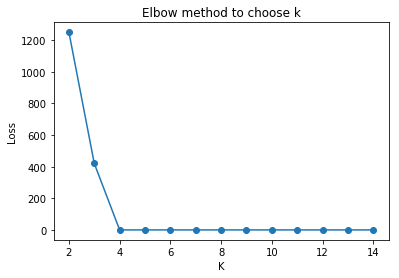

In [98]:
# Find k using elbow method
find_optimal_k(std_data)

In [99]:
# KMeans Clustering
clf = KMeans(n_clusters = 3)
clf.fit(std_data)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [ ]:
final["cluster_label"] = clf.labels_

Total number of review in cluster 0 is: 49975


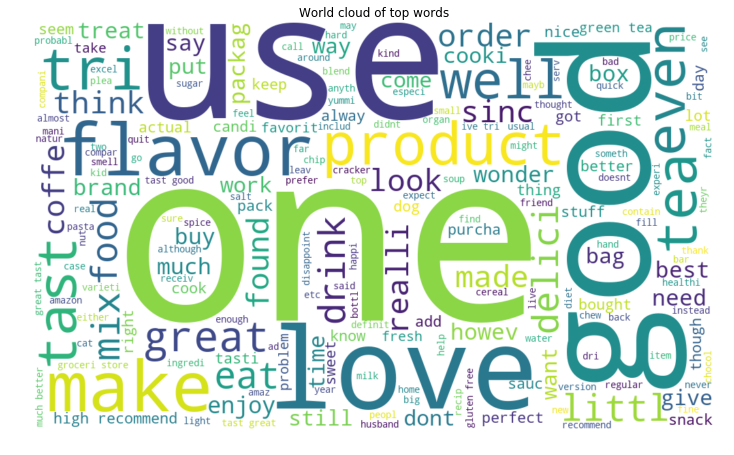

Total number of review in cluster 1 is: 13


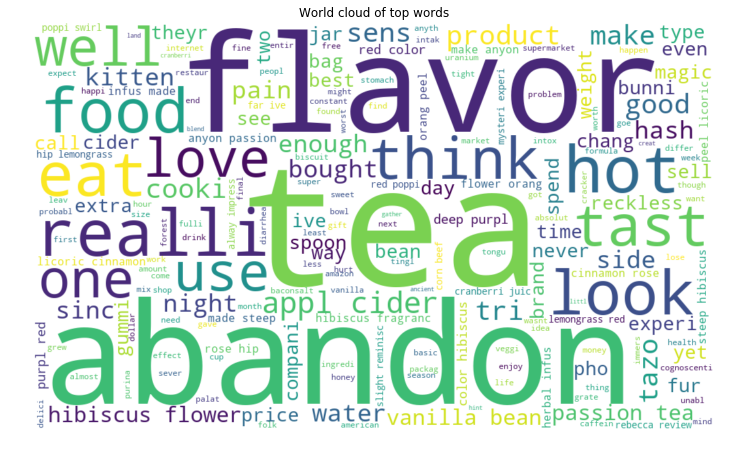

Total number of review in cluster 2 is: 12


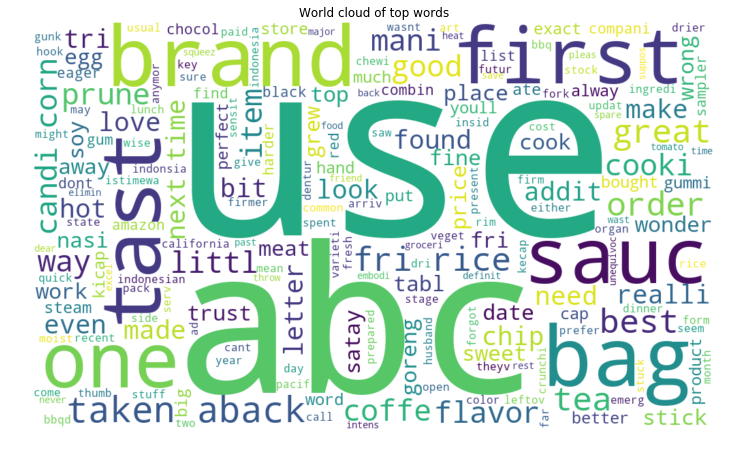

In [103]:
# Same as the average word2vec of k means clustering 
# Although we can create a function to print wordcloud but let it be for now
for i in range(clf.n_clusters):
    l = list()
    label = final.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(final.loc[label[j]]["CleanedText"].decode())
        #print(l)
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Observations**<br>
1. We have total 3 cluster and some words are mixed with other cluster.

# Hierarchical Clustering

## Bag of Word

In [254]:
# Take first 5k data poits because agglomerative cluster is computational very expensive
# We can take more than this in high config system
df = cleaned_data.iloc[:5000,:]
df.shape

(5000, 12)

In [255]:
# Text that we will work on
X = df["CleanedText"]
X.shape

(5000,)

In [256]:
# Vectorization
bow = CountVectorizer()
bow_feat = bow.fit_transform(X)
bow_feat

<5000x11508 sparse matrix of type '<class 'numpy.int64'>'
	with 179435 stored elements in Compressed Sparse Row format>

In [257]:
# Standardization
std = StandardScaler(with_mean = False)
std_feat = std.fit_transform(bow_feat)
std_feat = std_feat.toarray()

In [259]:
# There is no appropiate method to choose number of cluster, so we can just give a try with different number of cluster.
# Somewhere dendogram is used to choose number of cluster for hirarchical clustering but again it's very hard question to answer-->"where you will cut in dendrogram to choose n_cluster?"
# When number of cluster is 2
# using euclidean distance as affinity to compute distances b/w clusters
# and linkage is ward that minimizes the variance of the clusters being merged and it only used with the euclidean distance
# We can use any linkage and affinity but ward is recommended 
clf = AgglomerativeClustering(n_clusters = 2, affinity = "euclidean", linkage = "ward")
labels = clf.fit_predict(std_feat)

In [260]:
clf.labels_.shape

(5000,)

In [261]:
# Assign each review to its cluster label in dataframe
df["cluster_label"] = clf.labels_

Total number of review in cluster 0 is: 2


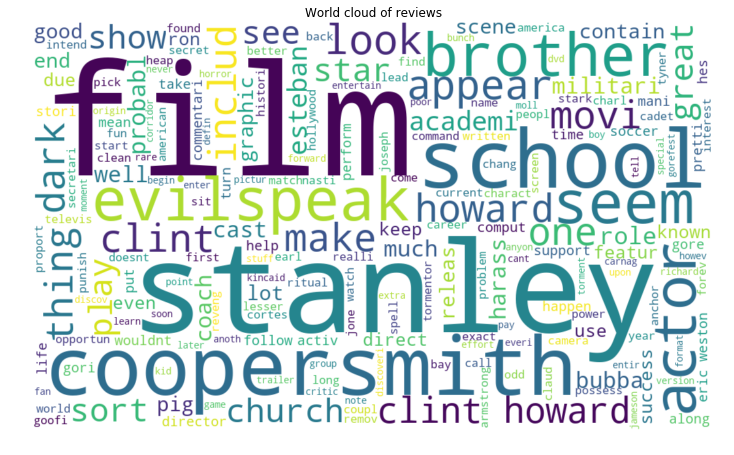

Total number of review in cluster 1 is: 4998


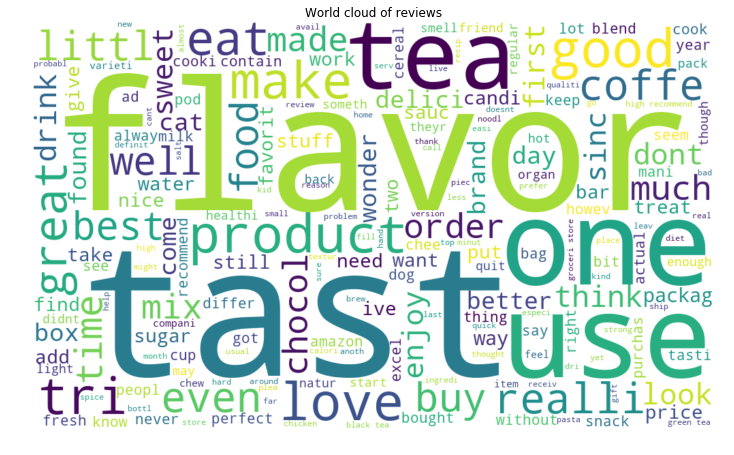

In [266]:
# same as average word2vec of k means clustering
for i in range(clf.n_clusters):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(df.loc[label[j]]["CleanedText"].decode())
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

In [267]:
# Agglomerative clustering with 5 cluster
clf = AgglomerativeClustering(n_clusters = 5, affinity = "euclidean", linkage = "ward")
labels = clf.fit_predict(std_feat)

In [269]:
# Assign cluster labels to each review in the data-points
df["cluster_label"] = clf.labels_

Total number of review in cluster 0 is: 4996


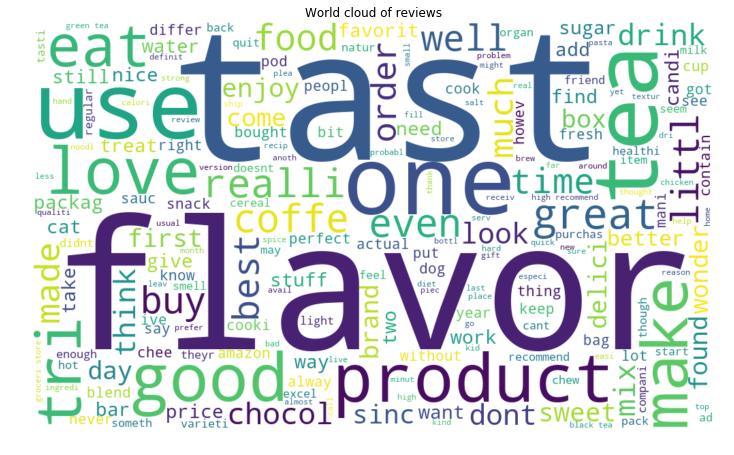

Total number of review in cluster 1 is: 1


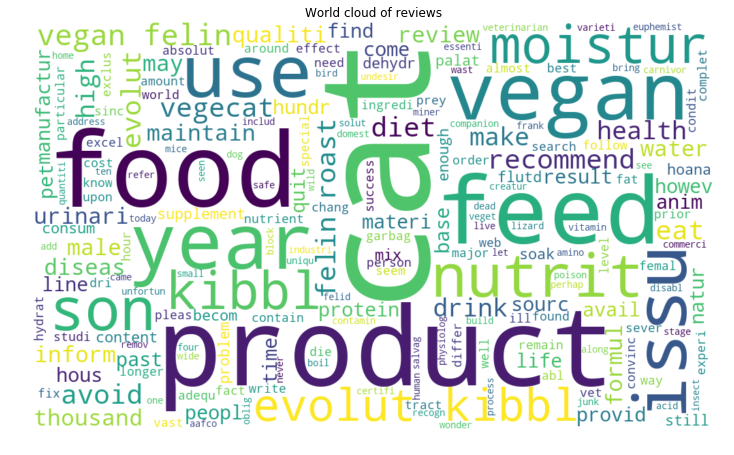

Total number of review in cluster 2 is: 1


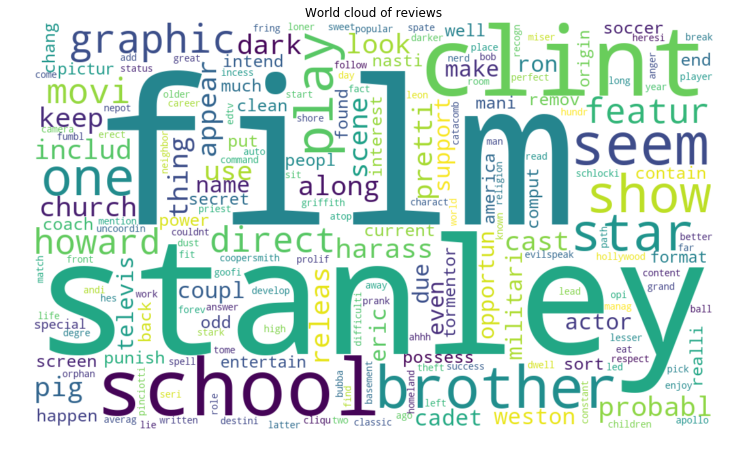

Total number of review in cluster 3 is: 1


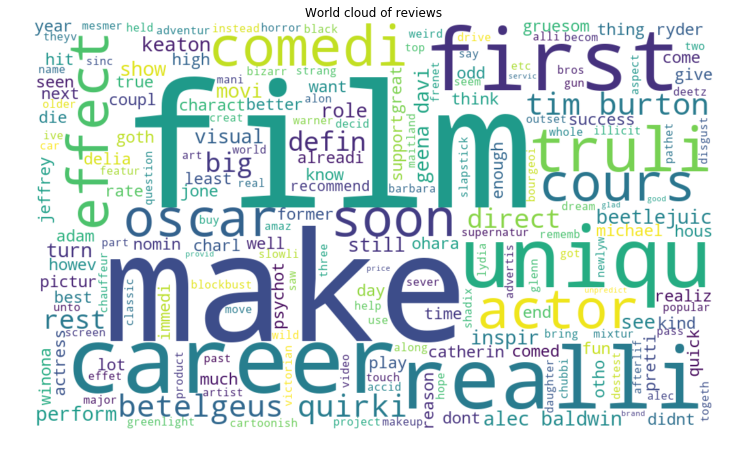

Total number of review in cluster 4 is: 1


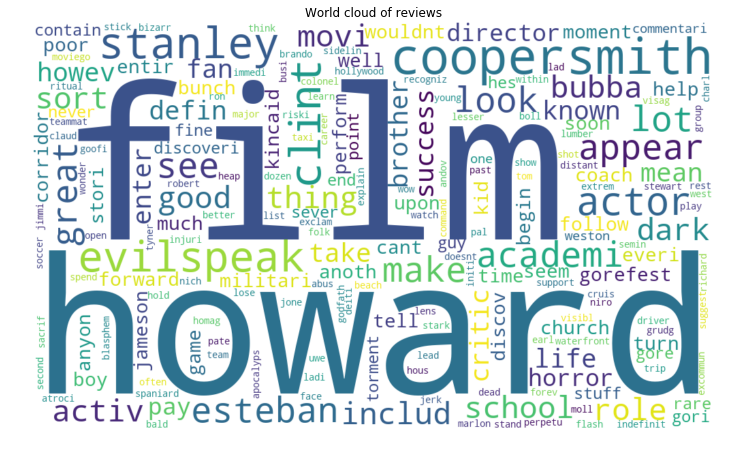

In [270]:
# Same as average word2vec k means clustering
for i in range(clf.n_clusters):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(df.loc[label[j]]["CleanedText"].decode())
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

1. We applied agglomerative clustering with 3 and 5 cluster and found that some cluster are common for both 2 and 5 cluster, even some words are common, when we took 5 number of cluster.
2. We assign cluster label for each data points and plotted wordcloud of given text of corresponding class label.
3. As we can see words are grouped nicely in almost all cluster. 

## TF-IDF

In [271]:
# Data
X = df["CleanedText"]
X.shape

(5000,)

In [272]:
# Featurization
tfidf = TfidfVectorizer()
feat = tfidf.fit_transform(X)
feat

<5000x11508 sparse matrix of type '<class 'numpy.float64'>'
	with 179435 stored elements in Compressed Sparse Row format>

In [273]:
# Standardization
std = StandardScaler(with_mean = False)
std_data = std.fit_transform(feat)
std_data = std_data.toarray()

In [274]:
# When number of cluster is 2
clf = AgglomerativeClustering(n_clusters = 2, affinity = "euclidean", linkage = "ward")
labels = clf.fit_predict(std_data)

In [275]:
# Cluster labels shape
clf.labels_.shape

(5000,)

In [ ]:
# Assign each cluster label corresponding to its data-points 
df["cluster_label"] = clf.labels_

Total number of review in cluster 0 is: 2


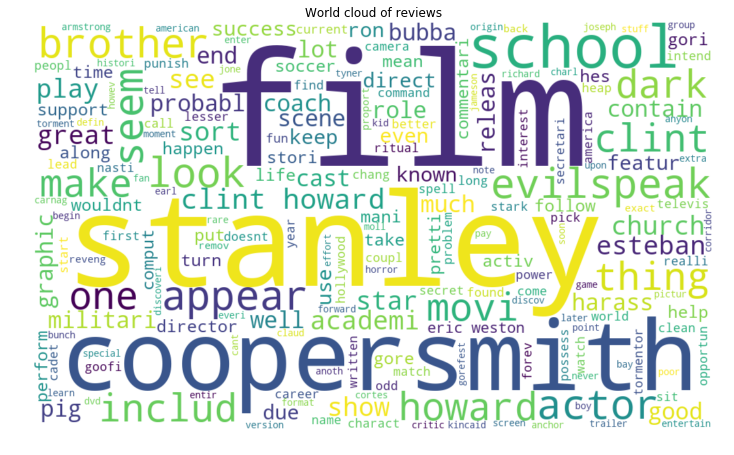

Total number of review in cluster 1 is: 4998


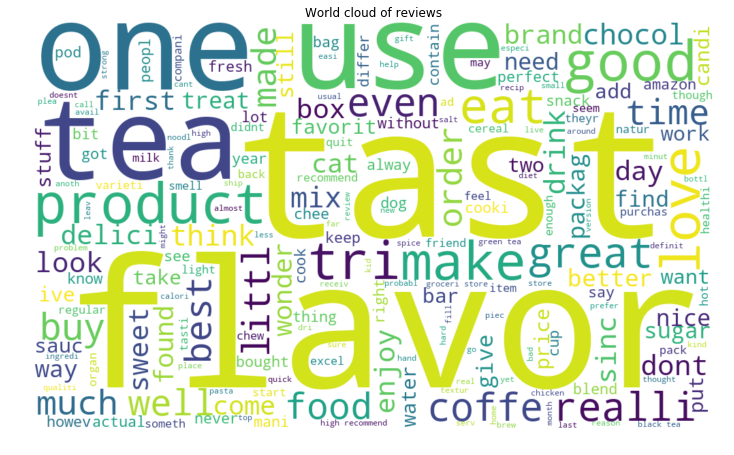

In [278]:
# Same as average word2vec k means clustering
for i in range(clf.n_clusters):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(df.loc[label[j]]["CleanedText"].decode())
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

In [279]:
# When number of cluster is 5
clf = AgglomerativeClustering(n_clusters = 5, affinity = "euclidean", linkage = "ward")
labels = clf.fit_predict(std_data)

In [280]:
# cluster labels shape
clf.labels_.shape

(5000,)

In [283]:
# Assign each data-points corresponding to its cluster label 
df["cluster_label"] = clf.labels_

Total number of review in cluster 0 is: 4996


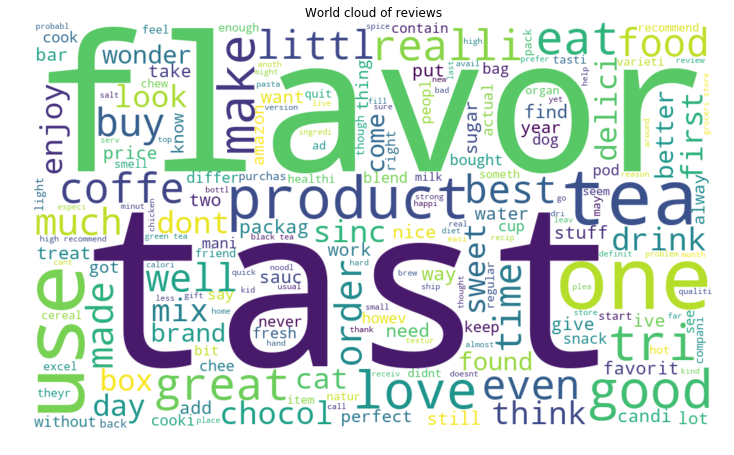

Total number of review in cluster 1 is: 1


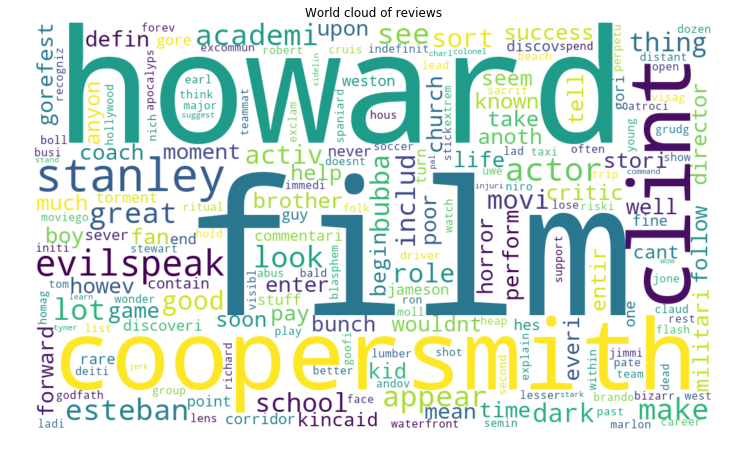

Total number of review in cluster 2 is: 1


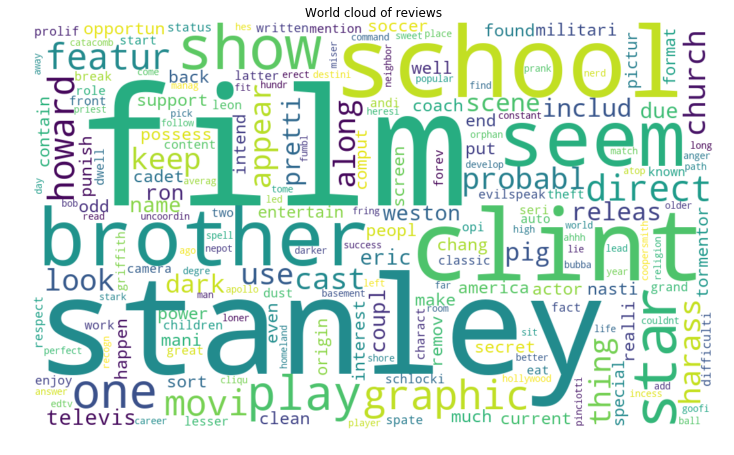

Total number of review in cluster 3 is: 1


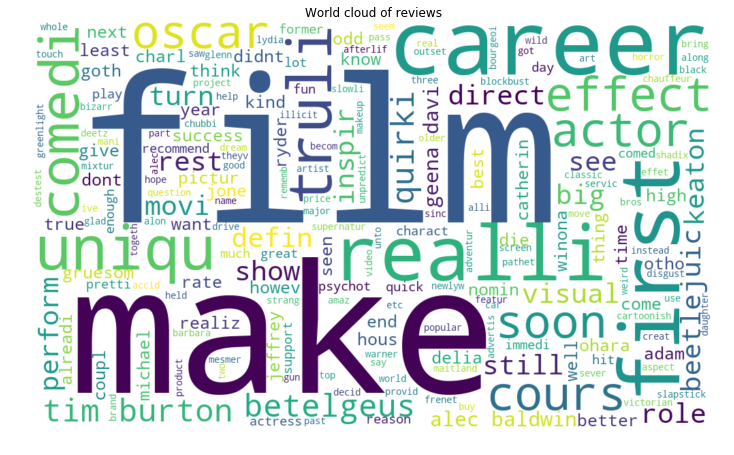

Total number of review in cluster 4 is: 1


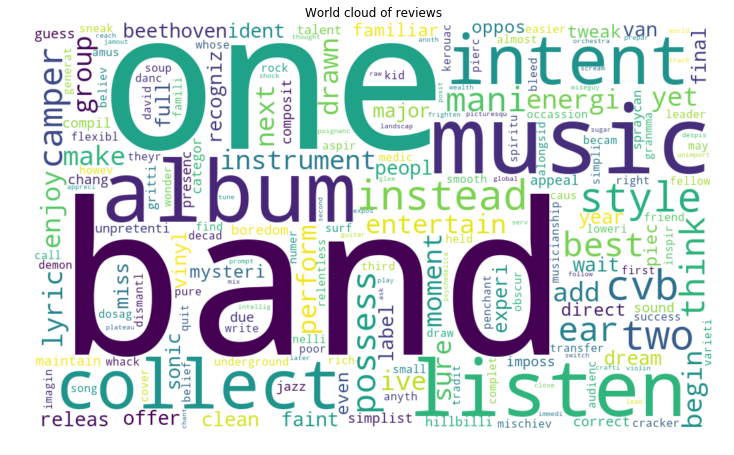

In [284]:
# Same as the previous one
for i in range(clf.n_clusters):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(df.loc[label[j]]["CleanedText"].decode())
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Observations**</br>
1. We took 2 and 5 number of cluster and applied agglomerative clustering and observe that words that contain similar intent are grouped together.

## Word2Vec

In [286]:
# data
X = df["Text"]
X.shape

(5000,)

In [287]:
# Utility function for cleaning tags and punctuations
import re
def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned

In [288]:
# Train your own Word2Vec model using your own train text corpus
import gensim
list_of_sent=[]
#for sent in final_40k['Text'].values:
for sent in X:
    filtered_sentence=[]
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_sent.append(filtered_sentence)

In [289]:
# Word2vec model
w2v_model = gensim.models.Word2Vec(list_of_sent, min_count = 5, size = 50, workers = 4)

In [290]:
# Get most_similar word like like
w2v_model.wv.most_similar('like')

[('but', 0.8052593469619751),
 ('really', 0.791375994682312),
 ('taste', 0.7891703844070435),
 ('think', 0.780022382736206),
 ('real', 0.7688242197036743),
 ('tastes', 0.759600043296814),
 ('too', 0.7508002519607544),
 ('raise', 0.7461390495300293),
 ('overly', 0.7456965446472168),
 ('texture', 0.7441191673278809)]

In [291]:
# word2vec vocabulary
w2v = w2v_model[w2v_model.wv.vocab]

In [292]:
# Shape of word2vec vocabulary
w2v.shape

(5127, 50)

### Average Word2Vec

In [293]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = [] # the avg-w2v for each sentence/review is stored in this list
for sent in list_of_sent: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    cnt_words = 0 # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

5000
50


In [294]:
# Convert list of sent_vectors to an array
X = np.array(sent_vectors)
X.shape

(5000, 50)

In [295]:
# Standardization
std = StandardScaler(with_mean = False)
std_data = std.fit_transform(X)

In [296]:
# When number of cluster is 2
clf = AgglomerativeClustering(n_clusters = 2, affinity = "euclidean", linkage = "ward")
labels = clf.fit_predict(std_data)

In [297]:
# Cluster labels shape
clf.labels_.shape

(5000,)

In [299]:
# Assign each data points to its corresponding cluster
df["cluster_label"] = clf.labels_

Total number of review in cluster 0 is: 3076


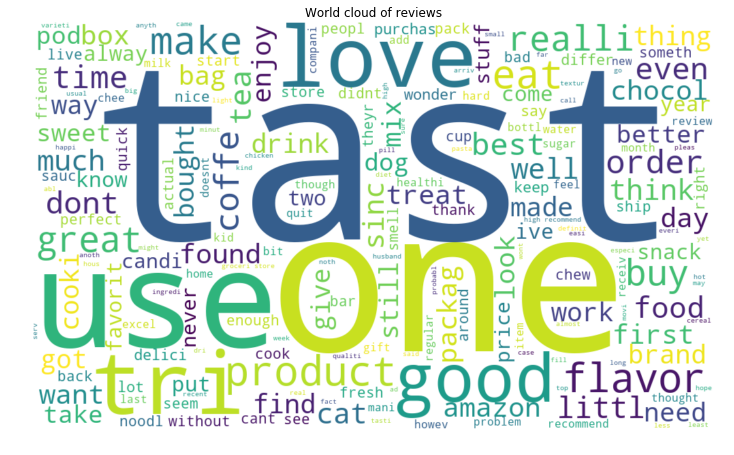

Total number of review in cluster 1 is: 1924


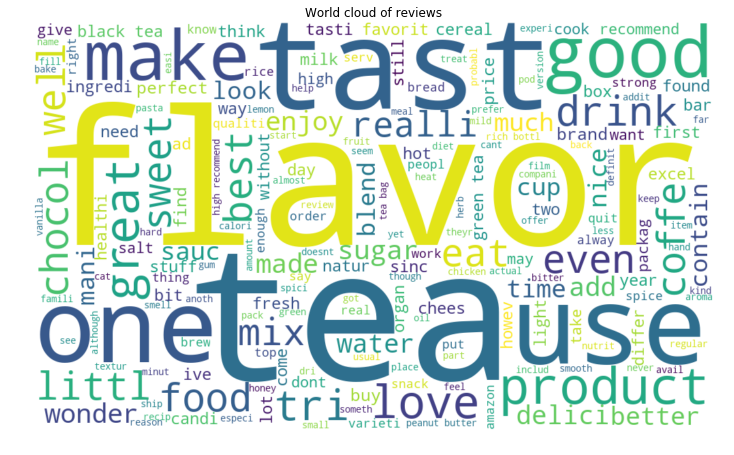

In [300]:
# Same as average word2vec of k means clustering
for i in range(clf.n_clusters):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(df.loc[label[j]]["CleanedText"].decode())
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

In [301]:
# When number of cluster is 5 
clf = AgglomerativeClustering(n_clusters = 5, affinity = "euclidean", linkage = "ward")
labels = clf.fit_predict(std_data)

In [302]:
# cluster labels shape
clf.labels_.shape

(5000,)

In [304]:
# Assign each review to its corresponding cluster label
df["cluster_label"] = clf.labels_

Total number of review in cluster 0 is: 972


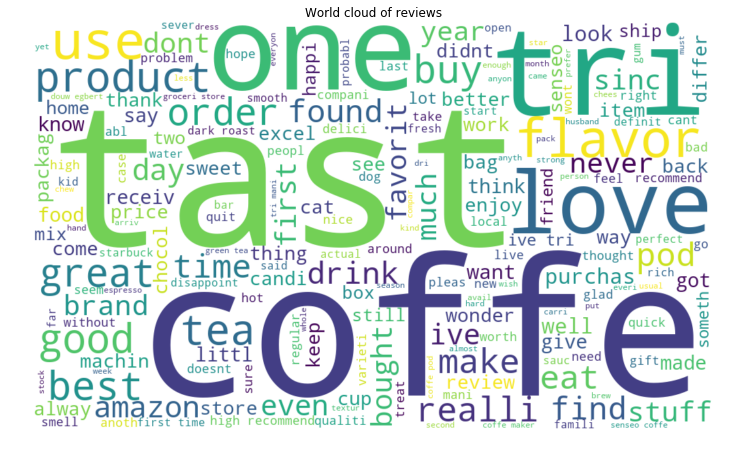

Total number of review in cluster 1 is: 1357


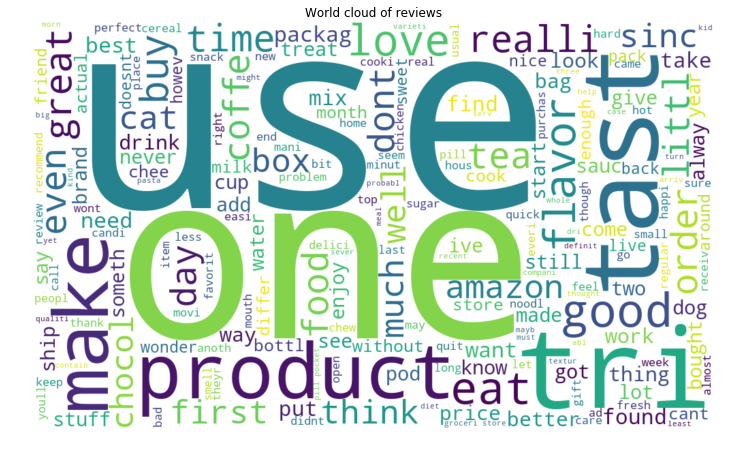

Total number of review in cluster 2 is: 747


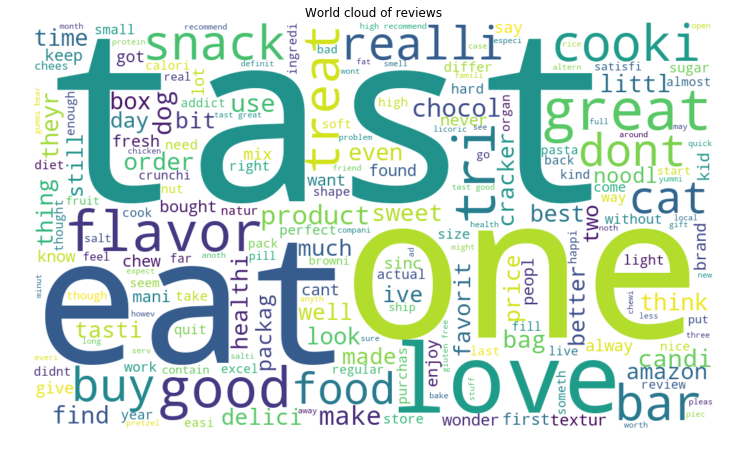

Total number of review in cluster 3 is: 1368


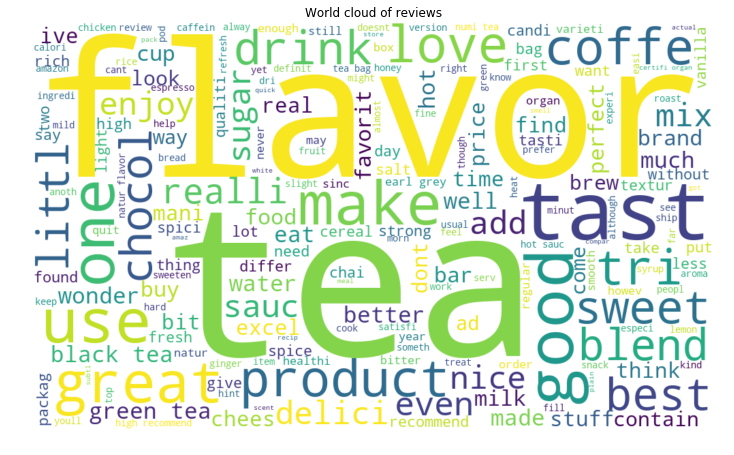

Total number of review in cluster 4 is: 556


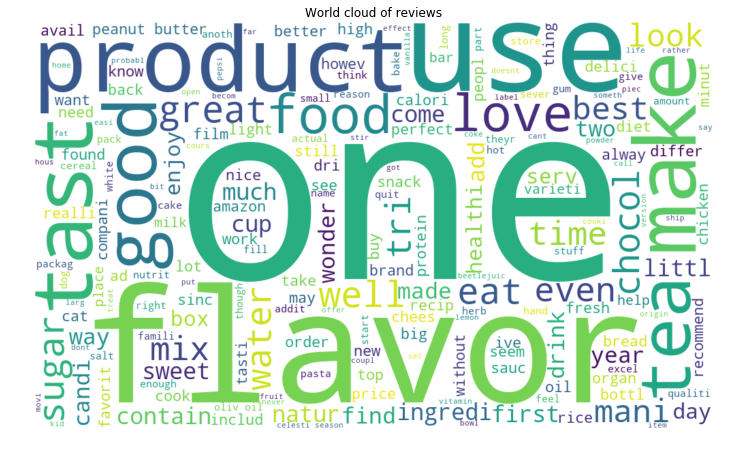

In [305]:
# Same as average word2vec of k means clustering
for i in range(clf.n_clusters):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(df.loc[label[j]]["CleanedText"].decode())
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Observations**<br>
1. Many words are common in each cluster and some that intent is same are nicely grouped together.

### TFIDF Word2Vec

In [308]:
# TF-IDF weighted Word2Vec
tfidf_feat = tfidf.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf
tfidf_sent_vectors = [] # the tfidf-w2v for each sentence/review is stored in this list
row=0
for sent in list_of_sent: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            # obtain the tf_idfidf of a word in a sentence/review
            tf_idf = X[row, tfidf_feat.index(word)]
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
        except:
            pass
    sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

In [309]:
print(len(tfidf_sent_vectors))
print(len(tfidf_sent_vectors[0]))

5000
50


In [312]:
# Assign each data-points to its corresponding cluster label
X = np.array(tfidf_sent_vectors)
X.shape

(5000, 50)

In [315]:
# Standardization
std = StandardScaler(with_mean = False)
std_data = std.fit_transform(X)

In [318]:
# Nan, infinite float to number
std_data = np.nan_to_num(std_data)

In [319]:
# When number of cluster is 2
clf = AgglomerativeClustering(n_clusters = 2, affinity = "euclidean", linkage = "ward")
labels = clf.fit_predict(std_data)

In [320]:
# shape of cluster labels
clf.labels_.shape

(5000,)

In [322]:
# Assign each data-points to its corresponding cluster label
df["cluster_label"] = clf.labels_

Total number of review in cluster 0 is: 40


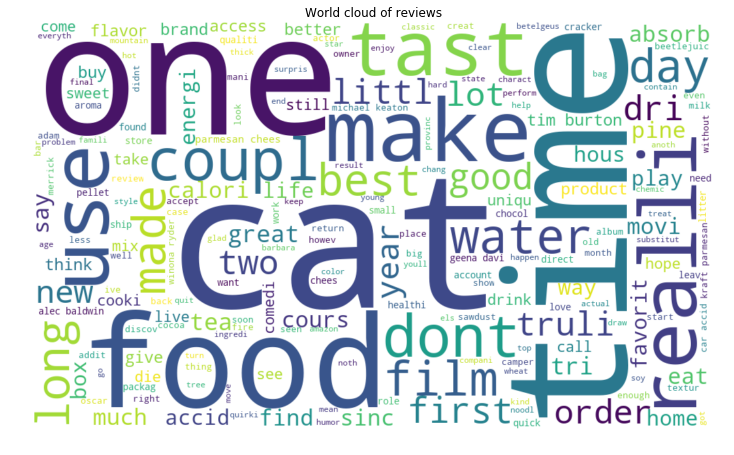

Total number of review in cluster 1 is: 4960


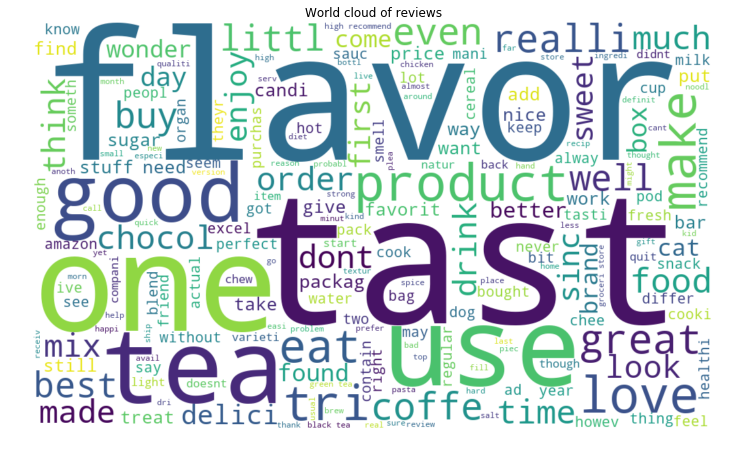

In [323]:
# Same as average word2vec of k means clustering.
for i in range(clf.n_clusters):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    #print(label)
    #print(len(label))
    for j in range(len(label)):
        l.append(df.loc[label[j]]["CleanedText"].decode())
        #print(l)
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

In [324]:
# When number of cluster is 5
clf = AgglomerativeClustering(n_clusters = 5, affinity = "euclidean", linkage = "ward")
labels = clf.fit_predict(std_data)

In [325]:
clf.labels_.shape

(5000,)

In [327]:
df["cluster_label"] = clf.labels_

Total number of review in cluster 0 is: 19


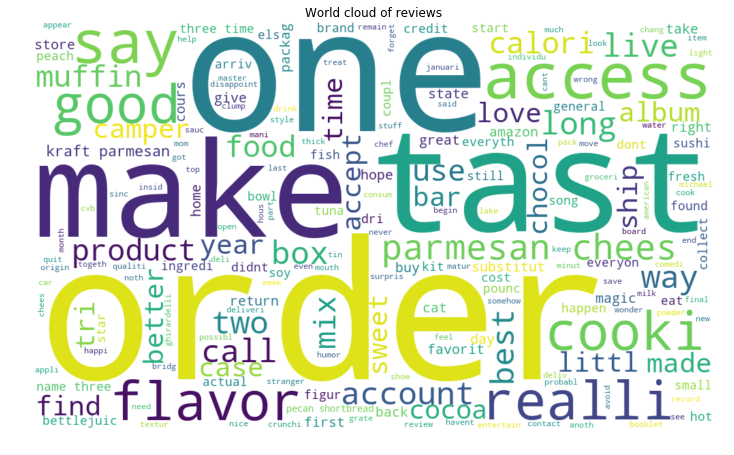

Total number of review in cluster 1 is: 8


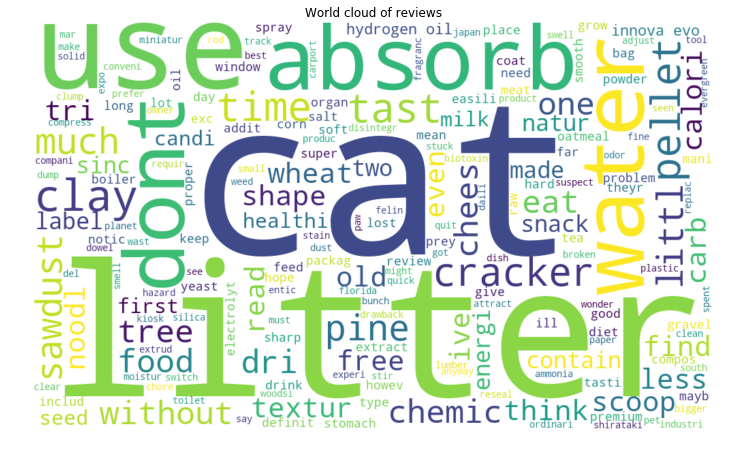

Total number of review in cluster 2 is: 13


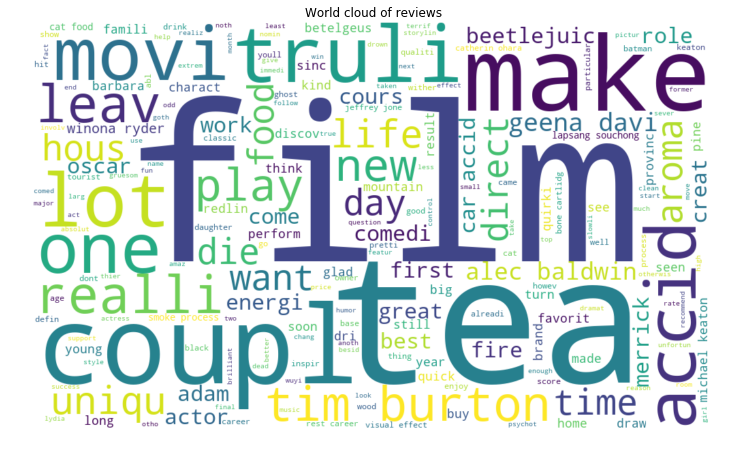

Total number of review in cluster 3 is: 1


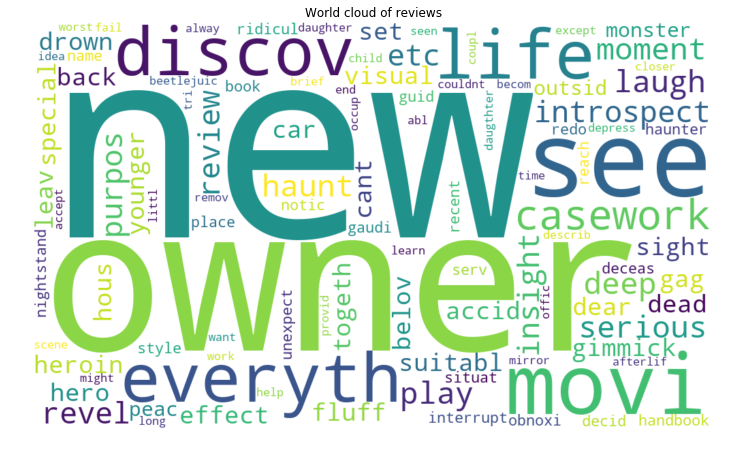

Total number of review in cluster 4 is: 4959


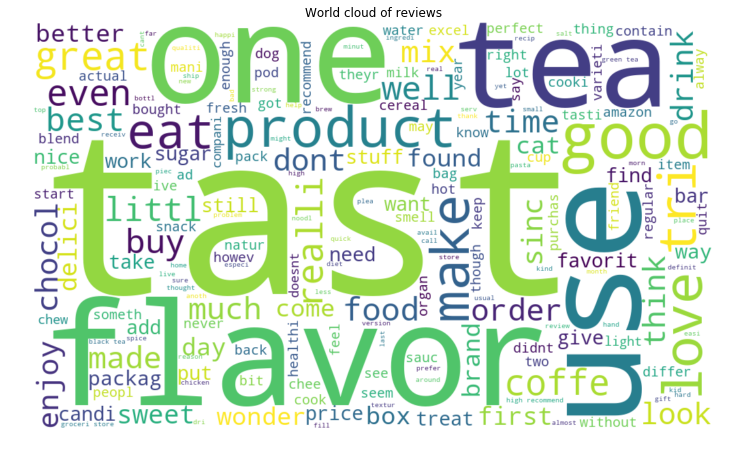

In [328]:
# same as previous one
for i in range(clf.n_clusters):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    #print(label)
    #print(len(label))
    for j in range(len(label)):
        l.append(df.loc[label[j]]["CleanedText"].decode())
        #print(l)
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Observations**<br>
1. In this clustering, we observe that words are differnet from the previous cluster and most of the cluster are sparse. i.e. Cluster label belongs to more points is very less. 

# DBSCAN

## Bag of Word

In [596]:
# Take first 5k data-points 
df = cleaned_data.iloc[:5000,:]
df.shape

(5000, 12)

In [597]:
# Take cleanedtext out of other features
X = df["CleanedText"]
X.shape

(5000,)

In [598]:
# Vectorizor
bow = CountVectorizer()
feat = bow.fit_transform(X)
feat

<5000x11508 sparse matrix of type '<class 'numpy.int64'>'
	with 179435 stored elements in Compressed Sparse Row format>

In [599]:
# Standardization
std = StandardScaler(with_mean = False)
std_feat = std.fit_transform(feat)
std_feat

<5000x11508 sparse matrix of type '<class 'numpy.float64'>'
	with 179435 stored elements in Compressed Sparse Row format>

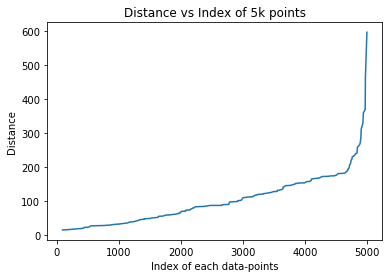

In [600]:
# Elbow method to choose eps(epsilon)
# To compute distance from each data-points to its 50th neighbors
from sklearn.neighbors import NearestNeighbors
# As the Rule of thumb is to take 2 * d(dimension) for minpts but we are not taking because the total no of points we have is 5k and dimension of data is 11k.
# Variable with minpts equal to 50 
minpts = 50
# Dictionary to store distance and index 
d = {}
# sklearn Nearest neighbors classifier with number of neighbors = minpts(50)
clf = NearestNeighbors(n_neighbors = minpts, metric = "euclidean")
# Fitting classifier
clf.fit(std_feat)
# Find the k neighbors(in our case it is 50) of each xi and will return distance to its neighbors and indices of each xi's
dist_idx = clf.kneighbors(n_neighbors = minpts, return_distance = True)
dist_idx = np.array(dist_idx)
# Get the distance and indices of the last neighbor
for dist, idx in zip(dist_idx[0], dist_idx[1]):
    d[idx[-1]] = dist[-1]
# Sort distances according to ascending order
sorted_d = sorted((value,key) for (key, value) in d.items())
distance = []
index = []
# Get the index and distance and store it in two different variable
for d, i in sorted_d:
    distance.append(d)
    index.append(i)
# Plot index on x-axis and distance on y-axis
plt.plot(sorted(index), distance)
plt.title("Distance vs Index of 5k points")
plt.xlabel("Index of each data-points")
plt.ylabel("Distance")
plt.show()

In [601]:
# DBSCAN with eps 300 and min_sample 50 
# Typically, We choose min_points is equal to the 2 times of dimension of the data-points or 
# If we have noisy data then we take large min_points or according to the domain experts
# We choose hyperparameter eps(epsilon) by calculaing the distance from each points and sort them in increasing order and then plot, where the knee occur we take it as the eps value from distance. 
# https://stats.stackexchange.com/questions/88872/a-routine-to-choose-eps-and-minpts-for-dbscan
# https://stats.stackexchange.com/questions/79470/how-to-compare-dbscan-clusters-choose-epsilon-parameter?rq=1
clf = DBSCAN(eps = 150, min_samples = 50)
clf.fit(std_feat)

DBSCAN(algorithm='auto', eps=150, leaf_size=30, metric='euclidean',
    metric_params=None, min_samples=50, n_jobs=None, p=None)

In [602]:
# -1 denotes it is noisy points
print("Total number of cluster with label -1 is: ", list(clf.labels_).count(-1))
print("total number of cluster with label 0 is: ", list(clf.labels_).count(0))

Total number of cluster with label -1 is:  630
total number of cluster with label 0 is:  4370


In [603]:
# Assign each datapoints to its corresponding cluster
df["cluster_label"] = clf.labels_ 

Total number of review in cluster 0 is: 4370


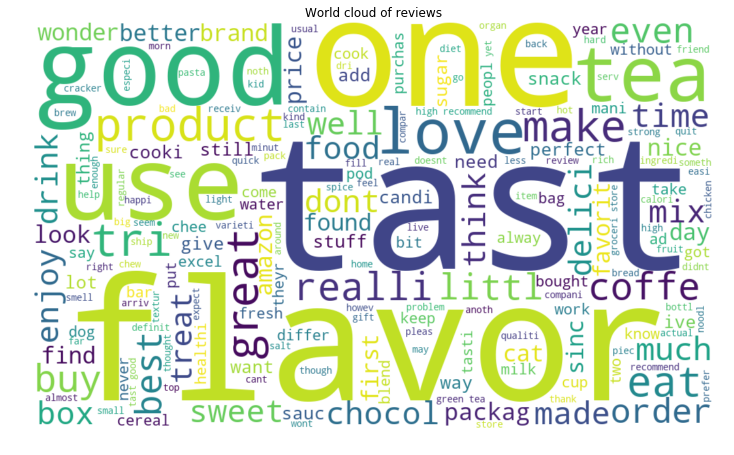

In [604]:
# Same as average word2vec of k-means clustering
for i in range(len(set(clf.labels_)) - 1):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
            l.append(df.loc[label[j]]["CleanedText"].decode())
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Observations**<br>
1. By applying epsilon 150 and min_sample 50 we found that only two cluster where each points belongs to either of one cluster. The cluster label is -1 and 0 where -1 represents noisy points, so basically we have only one cluster.
2. As we can see this cluster is also same as the previous one, where not all words are same intent but they are somehow related in some context.

## Tf-Idf

In [605]:
# data
X = df["CleanedText"]
X.shape

(5000,)

In [606]:
# TFIDF
tfidf = TfidfVectorizer()
tfidf_vect = tfidf.fit_transform(X)
tfidf_vect

<5000x11508 sparse matrix of type '<class 'numpy.float64'>'
	with 179435 stored elements in Compressed Sparse Row format>

In [607]:
# Standardization 
std = StandardScaler(with_mean = False)
std_data = std.fit_transform(tfidf_vect)

(5000, 50)
(5000, 50)


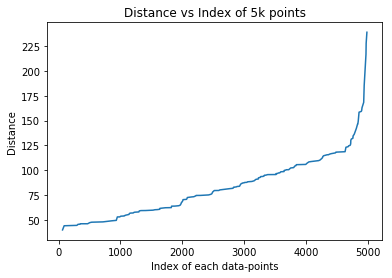

In [608]:
# Elbow method to choose eps(epsilon)
# As the Rule of thumb is to take 2 * d(dimension) for minpts but we are not taking because the total no of points we have is 5k only.
# To compute distance from its 50th neighbors
# Look at the DBSCAN implementation on bow representation.
from sklearn.neighbors import NearestNeighbors
minpts = 50
d = {}
clf = NearestNeighbors(n_neighbors = minpts, metric = "euclidean")
clf.fit(std_data)
dist_idx = clf.kneighbors(n_neighbors = minpts, return_distance = True)
dist_idx = np.array(dist_idx)
print(dist_idx[0].shape)
print(dist_idx[1].shape)
for dist, idx in zip(dist_idx[0], dist_idx[1]):
    d[idx[-1]] = dist[-1]
sorted_d = sorted((value,key) for (key, value) in d.items())
distance = []
index = []
for d, i in sorted_d:
    distance.append(d)
    index.append(i)
plt.plot(sorted(index), distance)
plt.title("Distance vs Index of 5k points")
plt.xlabel("Index of each data-points")
plt.ylabel("Distance")
plt.show()

In [609]:
# DBSCAN 
# For how to choose eps and min_sample? please look at the bag-of-words implementation of DBSCAN.
db = DBSCAN(eps = 120, min_samples = 50)
db.fit(std_feat)
label = db.labels_

In [610]:
# Total number of cluster with -1 label(noisy points) and 0 label
print(list(label).count(-1))
print(list(label).count(0))

1107
3893


In [611]:
# Assigning each cluster label to it's data-points
df["cluster_label"] = db.labels_

Total number of review in cluster 0 is: 3893


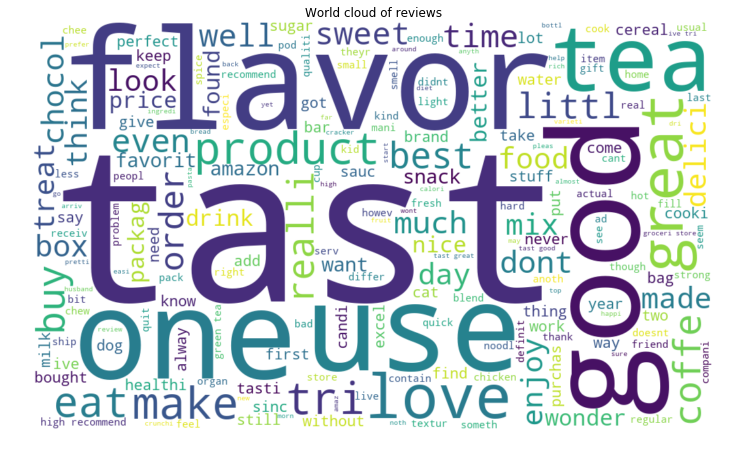

In [612]:
# Same as average word2vec of k-means clustering
for i in range(len(set(label)) - 1):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(df.loc[label[j]]["CleanedText"].decode())
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Observations**
1. look at the bow observations and read each comments across the notebook for clarification.
2. In this clustering we found that only 3893 review out of 5k with cluster label 0 others are noisy points.
3. Some most important word based on frequency have somehow same intent.

## Word2vec

In [613]:
# data
X = df["Text"]
X.shape

(5000,)

In [614]:
# Utlity function, cleaning html tag and punctuation from text data
import re
def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned

In [615]:
# Train your own Word2Vec model using your own train text corpus
import gensim
list_of_sent=[]
for sent in X:
    filtered_sentence=[]
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_sent.append(filtered_sentence)

In [616]:
# Word2vec model
w2v_model = gensim.models.Word2Vec(list_of_sent, min_count = 5, size = 50, workers = 4)

In [617]:
w2v_model.wv.most_similar('like')

[('dig', 0.7873243093490601),
 ('prefer', 0.7846037149429321),
 ('think', 0.7621347904205322),
 ('really', 0.7593311071395874),
 ('enjoy', 0.7527710199356079),
 ('real', 0.7491886615753174),
 ('but', 0.7443016767501831),
 ('lover', 0.7342784404754639),
 ('salty', 0.7308362126350403),
 ('thats', 0.7293223142623901)]

In [618]:
w2v = w2v_model[w2v_model.wv.vocab]

In [619]:
w2v.shape

(5127, 50)

### Average Word2Vec

In [620]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = [] # the avg-w2v for each sentence/review is stored in this list
for sent in list_of_sent: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    cnt_words = 0 # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

5000
50


In [622]:
# Convert list of sentene vector to a numpy array
X = np.array(sent_vectors)
X.shape

(5000, 50)

In [623]:
# Standardization 
std = StandardScaler()
std_data = std.fit_transform(X)
std_data

array([[-0.69691078,  1.40028207, -1.58341538, ..., -0.56981647,
         0.02264965,  0.66096866],
       [-0.92889669,  2.29276107, -2.16649166, ..., -0.70314666,
         0.16503233,  1.23771203],
       [-0.19175687, -0.28948908, -1.07915148, ..., -0.09286748,
         1.6555249 ,  0.29510069],
       ...,
       [-2.17941495, -2.49529037,  1.73894397, ..., -1.88506795,
         1.3805718 , -1.34770072],
       [-0.33675432, -1.77728296,  0.67852954, ..., -0.50716577,
         1.63709842,  0.0651854 ],
       [-0.06948653, -1.39221758,  0.71253417, ..., -0.16654918,
        -0.17237851, -1.22497782]])

In [624]:
std_data = np.nan_to_num(std_data)
std_data

array([[-0.69691078,  1.40028207, -1.58341538, ..., -0.56981647,
         0.02264965,  0.66096866],
       [-0.92889669,  2.29276107, -2.16649166, ..., -0.70314666,
         0.16503233,  1.23771203],
       [-0.19175687, -0.28948908, -1.07915148, ..., -0.09286748,
         1.6555249 ,  0.29510069],
       ...,
       [-2.17941495, -2.49529037,  1.73894397, ..., -1.88506795,
         1.3805718 , -1.34770072],
       [-0.33675432, -1.77728296,  0.67852954, ..., -0.50716577,
         1.63709842,  0.0651854 ],
       [-0.06948653, -1.39221758,  0.71253417, ..., -0.16654918,
        -0.17237851, -1.22497782]])

(5000, 100)
(5000, 100)


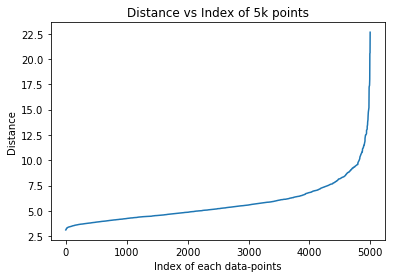

In [625]:
# Elbow method to choose epsilon(eps) with min_points = 2 * dimension of data 
# Look at the bow representation for more info
from sklearn.neighbors import NearestNeighbors
minpts = 100
d = {}
clf = NearestNeighbors(n_neighbors = minpts, metric = "euclidean")
clf.fit(std_data)
dist_idx = clf.kneighbors(n_neighbors = minpts, return_distance = True)
dist_idx = np.array(dist_idx)
print(dist_idx[0].shape)
print(dist_idx[1].shape)
for dist, idx in zip(dist_idx[0], dist_idx[1]):
    d[idx[-1]] = dist[-1]
sorted_d = sorted((value,key) for (key, value) in d.items())
distance = []
index = []
for d, i in sorted_d:
    distance.append(d)
    index.append(i)
plt.plot(sorted(index), distance)
plt.title("Distance vs Index of 5k points")
plt.xlabel("Index of each data-points")
plt.ylabel("Distance")
plt.show()

In [626]:
# DBSCAN 
db = DBSCAN(eps = 10, min_samples = 100)
db.fit(std_data)
label = db.labels_
label

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [627]:
# Total number of data-points from each cluster 
# -1 shows it is noisy data-points 
print(list(label).count(0))
print(list(label).count(-1))

4983
17


In [629]:
# Put each cluster label with their corresponding data-points.
df["cluster_label"] = db.labels_

Total number of review in cluster 0 is: 4983


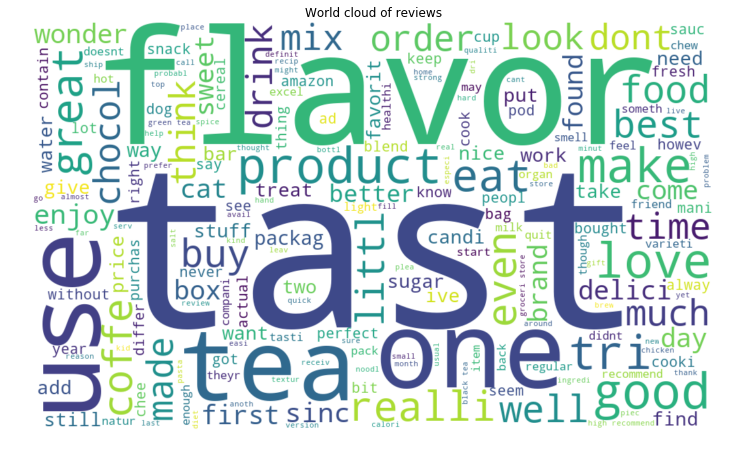

In [630]:
# Same as average word2vec of k means clustering
for i in range(len(set(label)) - 1):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(df.loc[label[j]]["CleanedText"].decode())
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Observations**<br>
1. We plotted distance vs index for each datapoints and found the knee and selected as the eps value with min_pts is 100 as the rule of thumb.
2. Wordcloud shows very less points are noisy points and except that all points belongs to cluster label 0 which means agglomerative clustering is not doing good job.

### TFIDF Word2Vec

In [631]:
# TF-IDF weighted Word2Vec
tfidf_feat = tfidf.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf
tfidf_sent_vectors = [] # the tfidf-w2v for each sentence/review is stored in this list
row=0
for sent in list_of_sent: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0 # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            # obtain the tf_idfidf of a word in a sentence/review
            tf_idf = tfidf_vect[row, tfidf_feat.index(word)]
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
        except:
            pass 
    sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

In [632]:
len(tfidf_sent_vectors)

5000

In [633]:
# List of elemetns to numpy array
X = np.array(tfidf_sent_vectors)
X.shape

(5000, 50)

In [634]:
# Standardization 
from sklearn.preprocessing import StandardScaler
std = StandardScaler(with_mean = False)
std_data = std.fit_transform(X)
std_data

array([[ 0.33110273, -3.3025755 ,  0.39343792, ..., -0.55934574,
         0.39930076,  0.03369972],
       [ 0.05662162, -2.86168218,  0.43007384, ..., -0.80944147,
         0.45715373,  0.62104666],
       [ 0.59087849, -1.24242262,  0.13701192, ...,  0.27001521,
        -0.37446743, -0.56639055],
       ...,
       [ 0.55293135, -4.45874217,  2.08530745, ..., -0.62187385,
         1.29781151, -1.7490451 ],
       [ 0.88850653, -5.83081859,  2.56206238, ..., -1.00131159,
         2.40239991, -0.73359261],
       [ 2.2438872 , -4.78716444,  1.75880202, ...,  1.0458991 ,
         1.73119511, -1.15331779]])

In [635]:
std_data = np.nan_to_num(std_data)

(5000, 100)
(5000, 100)


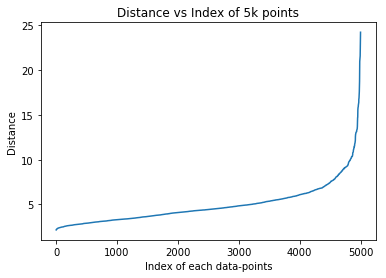

In [636]:
# Elbow method to choose eps(epsilon) with minpts = 2 * dimension of data
from sklearn.neighbors import NearestNeighbors
minpts = 100
d = {}
clf = NearestNeighbors(n_neighbors = minpts, metric = "euclidean")
clf.fit(std_data)
dist_idx = clf.kneighbors(n_neighbors = minpts, return_distance = True)
dist_idx = np.array(dist_idx)
print(dist_idx[0].shape)
print(dist_idx[1].shape)
for dist, idx in zip(dist_idx[0], dist_idx[1]):
    d[idx[-1]] = dist[-1]
sorted_d = sorted((value,key) for (key, value) in d.items())
distance = []
index = []
for d, i in sorted_d:
    distance.append(d)
    index.append(i)
plt.plot(sorted(index), distance)
plt.title("Distance vs Index of 5k points")
plt.xlabel("Index of each data-points")
plt.ylabel("Distance")
plt.show()

In [637]:
# DBSCAN
db = DBSCAN(eps = 9, min_samples = 100)
db.fit(std_data)
label = db.labels_
label

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [638]:
# Total number of cluster with 0 and -1 labels, where -1 represents it is noisy points
print(list(label).count(0))
print(list(label).count(-1))

4963
37


In [639]:
# Assigning each data-points to its corresponding labels
df["cluster_label"] = db.labels_

Total number of review in cluster 0 is: 4963


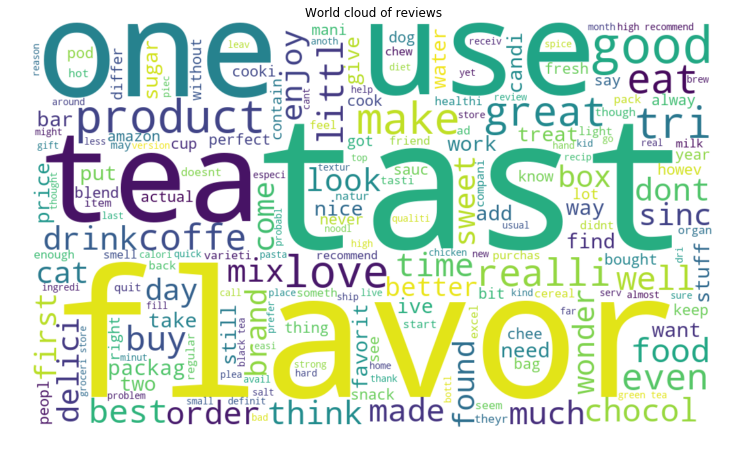

In [640]:
# This is same as average word2vec of k means clustering
for i in range(len(set(label)) - 1):
    l = list()
    label = df.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(df.loc[label[j]]["CleanedText"].decode())
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Observations**<br>
1. As we can see only 37 reviews are noisy except that all belongs to cluster 0. 
2. As we are getting reviews belongs to any one of the cluster and we are getting all review clustered together which means all review have same intent. Looks like bias cluster. 

**Conclusions** <br>
1. We use kmeans clustering with 50k datapoints and DBSCAN with 5k data-points on 4 set of techniques and for each featurization, choose k value and eps using elbow method respectively and also used agglomerative clustering with 5k data-points and just choose two different number of cluster(2 and 5) and plotted word cloud of all review, for all clustering technique.
2. We observe that in kmeans and agglomerative clustering, average word2vec perform slightely well. We are saying this just by looking at the cloud cluster because we did not apply any technique to check performence of kmeans or agglomerative clustering. In DBSCAN we can say that it not good as it clustered everything in a single cluster and as the review given by user is not same type of review.
3. I have written comment in each section of each technique please go through comments.